## Importing necessary modules

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

### Reading the csv file

In [95]:
df=pd.read_csv("expected_ctc.csv")

In [51]:
df.head()

,IDX,Applicant_ID,Total_Experience,Total_Experience_in_field_applied,Department,Role,Industry,Organization,Designation,Education,...,Curent_Location,Preferred_location,Current_CTC,Inhand_Offer,Last_Appraisal_Rating,No_Of_Companies_worked,Number_of_Publications,Certifications,International_degree_any,Expected_CTC
0,1,22753,0,0,NaN,NaN,NaN,NaN,NaN,PG,...,Guwahati,Pune,0,N,NaN,0,0,0,0,384551
1,2,51087,23,14,HR,Consultant,Analytics,H,HR,Doctorate,...,Bangalore,Nagpur,2702664,Y,Key_Performer,2,4,0,0,3783729
2,3,38413,21,12,Top Management,Consultant,Training,J,NaN,Doctorate,...,Ahmedabad,Jaipur,2236661,Y,Key_Performer,5,3,0,0,3131325
3,4,11501,15,8,Banking,Financial Analyst,Aviation,F,HR,Doctorate,...,Kanpur,Kolkata,2100510,N,C,5,3,0,0,2608833
4,5,58941,10,5,Sales,Project Manager,Insurance,E,Medical Officer,Grad,...,Ahmedabad,Ahmedabad,1931644,N,C,2,3,0,0,2221390


In [52]:
df.describe()

,IDX,Applicant_ID,Total_Experience,Total_Experience_in_field_applied,Passing_Year_Of_Graduation,Passing_Year_Of_PG,Passing_Year_Of_PHD,Current_CTC,No_Of_Companies_worked,Number_of_Publications,Certifications,International_degree_any,Expected_CTC
count,25000.000000,25000.000000,25000.000000,25000.000000,18820.000000,17308.000000,13119.000000,2.500000e+04,25000.000000,25000.000000,25000.000000,25000.000000,2.500000e+04
mean,12500.500000,34993.240080,12.493080,6.258200,2002.193624,2005.153571,2007.396372,1.760945e+06,3.482040,4.089040,0.773680,0.081720,2.250155e+06
std,7217.022701,14390.271591,7.471398,5.819513,8.316640,9.022963,7.493601,9.202125e+05,1.690335,2.606612,1.199449,0.273943,1.160480e+06
min,1.000000,10000.000000,0.000000,0.000000,1986.000000,1988.000000,1995.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,2.037440e+05
25%,6250.750000,22563.750000,6.000000,1.000000,1996.000000,1997.000000,2001.000000,1.027312e+06,2.000000,2.000000,0.000000,0.000000,1.306278e+06
50%,12500.500000,34974.500000,12.000000,5.000000,2002.000000,2006.000000,2007.000000,1.802568e+06,3.000000,4.000000,0.000000,0.000000,2.252136e+06
75%,18750.250000,47419.000000,19.000000,10.000000,2009.000000,2012.000000,2014.000000,2.443883e+06,5.000000,6.000000,1.000000,0.000000,3.051354e+06
max,25000.000000,60000.000000,25.000000,25.000000,2020.000000,2023.000000,2020.000000,3.999693e+06,6.000000,8.000000,5.000000,1.000000,5.599570e+06


In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 29 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   IDX                                25000 non-null  int64  
 1   Applicant_ID                       25000 non-null  int64  
 2   Total_Experience                   25000 non-null  int64  
 3   Total_Experience_in_field_applied  25000 non-null  int64  
 4   Department                         22222 non-null  object 
 5   Role                               24037 non-null  object 
 6   Industry                           24092 non-null  object 
 7   Organization                       24092 non-null  object 
 8   Designation                        21871 non-null  object 
 9   Education                          25000 non-null  object 
 10  Graduation_Specialization          18820 non-null  object 
 11  University_Grad                    18820 non-null  obj

### checking for any null values

In [54]:
df.isnull().sum()

IDX                                      0
Applicant_ID                             0
Total_Experience                         0
Total_Experience_in_field_applied        0
Department                            2778
Role                                   963
Industry                               908
Organization                           908
Designation                           3129
Education                                0
Graduation_Specialization             6180
University_Grad                       6180
Passing_Year_Of_Graduation            6180
PG_Specialization                     7692
University_PG                         7692
Passing_Year_Of_PG                    7692
PHD_Specialization                   11881
University_PHD                       11881
Passing_Year_Of_PHD                  11881
Curent_Location                          0
Preferred_location                       0
Current_CTC                              0
Inhand_Offer                             0
Last_Apprai

In [55]:
df["Passing_Year_Of_Graduation"].unique()

array([2020., 1988., 1990., 1997., 2004., 1998., 2011., 2001., 2003.,
       2000.,   nan, 2012., 2002., 2016., 2013., 1999., 1993., 2009.,
       1989., 1991., 2008., 2005., 2018., 1992., 1996., 2010., 2019.,
       1986., 2007., 2015., 1995., 2006., 2014., 1987., 2017., 1994.])

### Handling missing values

In [56]:
# 1. Separate categorical columns
cat_cols = [
    'Department','Role','Industry','Organization','Designation',
    'Education','Graduation_Specialization','University_Grad',
    'PG_Specialization','University_PG','PHD_Specialization',
    'University_PHD','Curent_Location','Preferred_location','Inhand_Offer',
    'Last_Appraisal_Rating']

# 2. Fill missing categorical with 'Unknown'
for col in cat_cols:
    df[col] = df[col].fillna('Unknown')

# 3. Fill missing numeric with mean
num_cols = df.select_dtypes(include=['int64','float64']).columns
df[num_cols] = df[num_cols].fillna(df[num_cols].mean())

# 4. One-hot encode the categorical columns
df_encoded_cats = pd.get_dummies(df[cat_cols], drop_first=True)
df_encoded_cats = df_encoded_cats.astype(int)

# 5. Drop the original categorical columns from df
df_numeric_part = df.drop(columns=cat_cols)

# 6. Combine numeric part with encoded categorical part
df= pd.concat([df_numeric_part, df_encoded_cats], axis=1)

In [57]:
df.head()

,IDX,Applicant_ID,Total_Experience,Total_Experience_in_field_applied,Passing_Year_Of_Graduation,Passing_Year_Of_PG,Passing_Year_Of_PHD,Current_CTC,No_Of_Companies_worked,Number_of_Publications,...,Preferred_location_Mumbai,Preferred_location_Nagpur,Preferred_location_Pune,Preferred_location_Surat,Inhand_Offer_Y,Last_Appraisal_Rating_B,Last_Appraisal_Rating_C,Last_Appraisal_Rating_D,Last_Appraisal_Rating_Key_Performer,Last_Appraisal_Rating_Unknown
0,1,22753,0,0,2020.0,2005.153571,2007.396372,0,0,0,...,0,0,1,0,0,0,0,0,0,1
1,2,51087,23,14,1988.0,1990.000000,1997.000000,2702664,2,4,...,0,1,0,0,1,0,0,0,1,0
2,3,38413,21,12,1990.0,1992.000000,1999.000000,2236661,5,3,...,0,0,0,0,1,0,0,0,1,0
3,4,11501,15,8,1997.0,1999.000000,2005.000000,2100510,5,3,...,0,0,0,0,0,0,1,0,0,0
4,5,58941,10,5,2004.0,2006.000000,2010.000000,1931644,2,3,...,0,0,0,0,0,0,1,0,0,0


### Checking for correlation

In [58]:
#Plotting correlation matrix
corr_matrix=df.corr()
plt.figure(figsize=(100,100))
sns.heatmap(corr_matrix,annot=True,fmt=".2f",cmap="coolwarm")
plt.show()

### Performing scatter plotting to check the trend

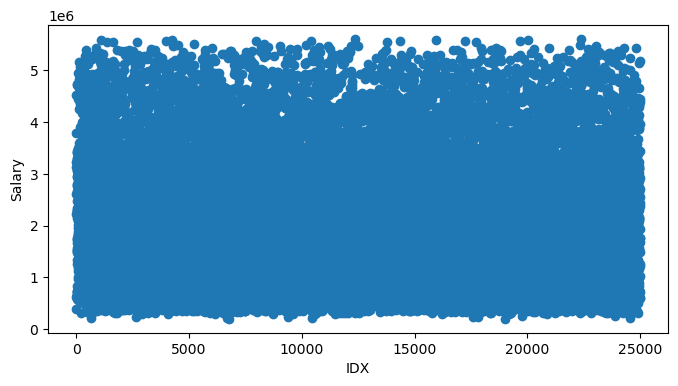

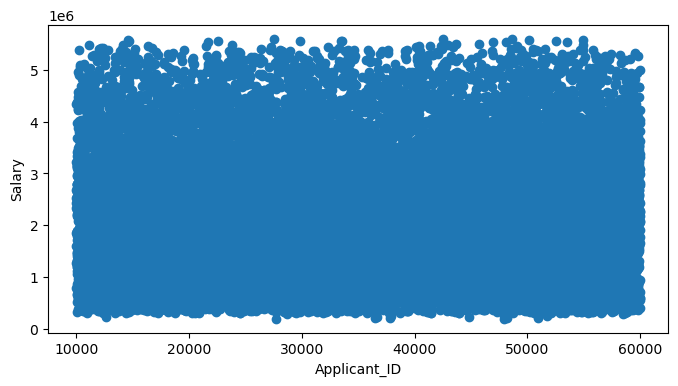

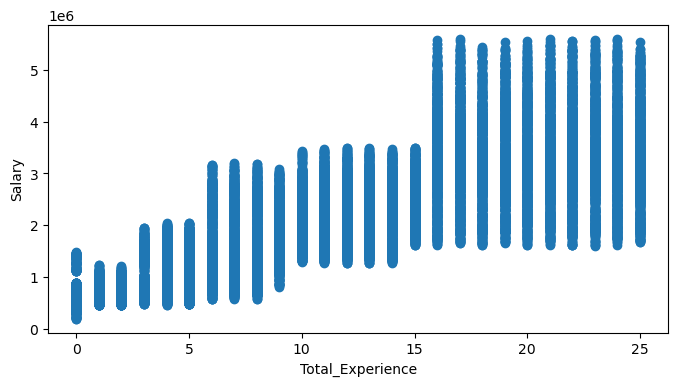

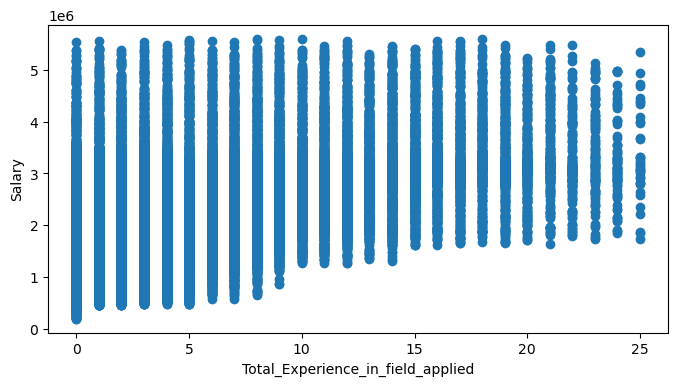

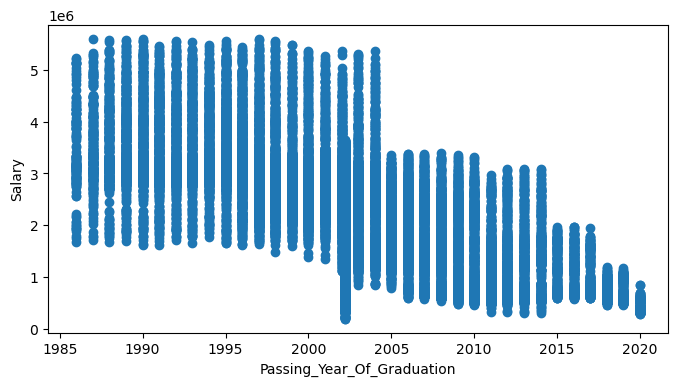

...

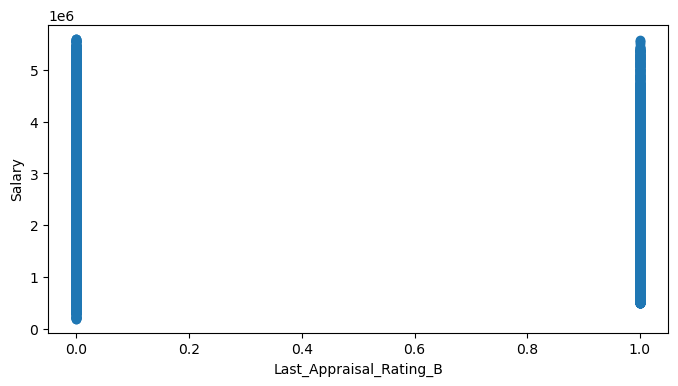

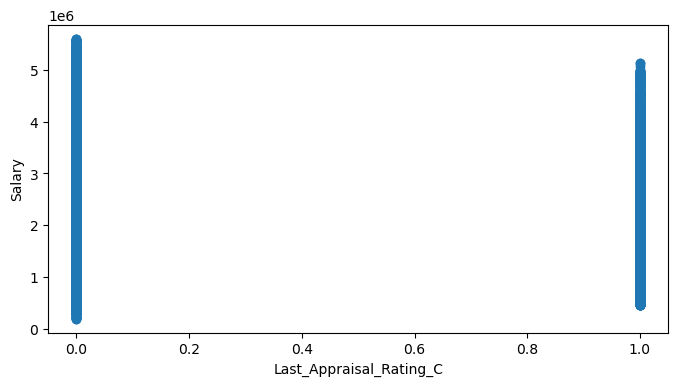

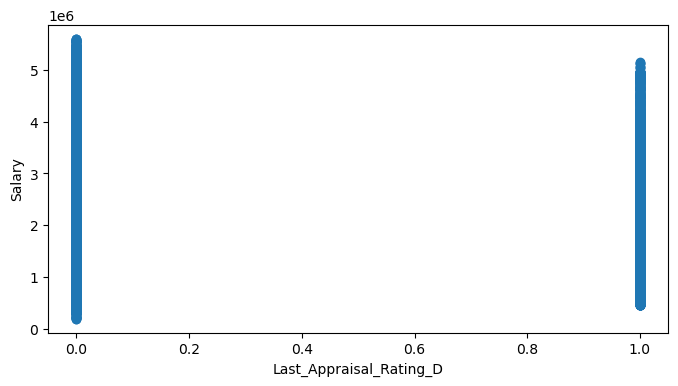

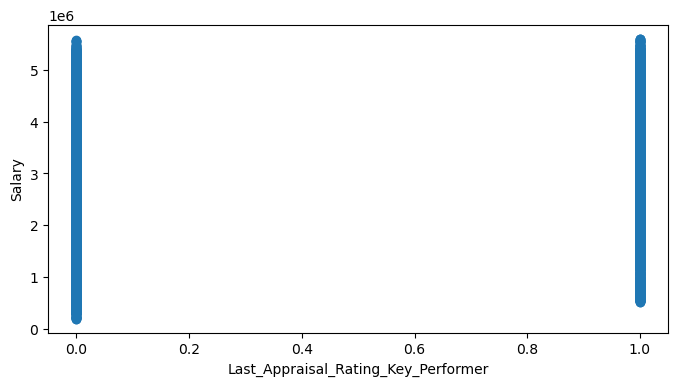

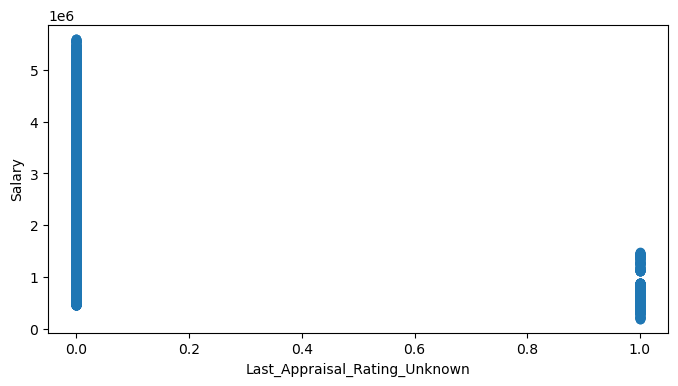

In [60]:
for label in df.columns[:]:
    plt.figure(figsize=(8,4))
    plt.scatter(df[label],df["Expected_CTC"])
    plt.xlabel(label)
    plt.ylabel("Salary")
    plt.show()

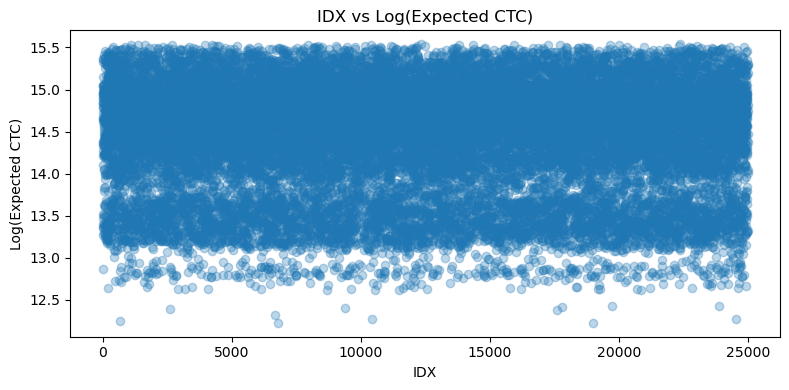

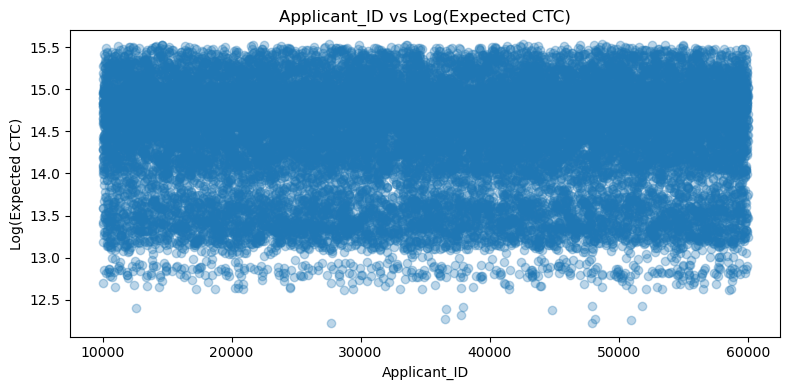

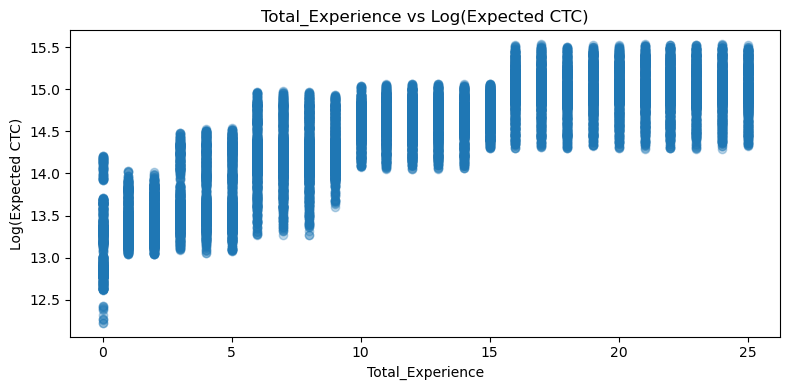

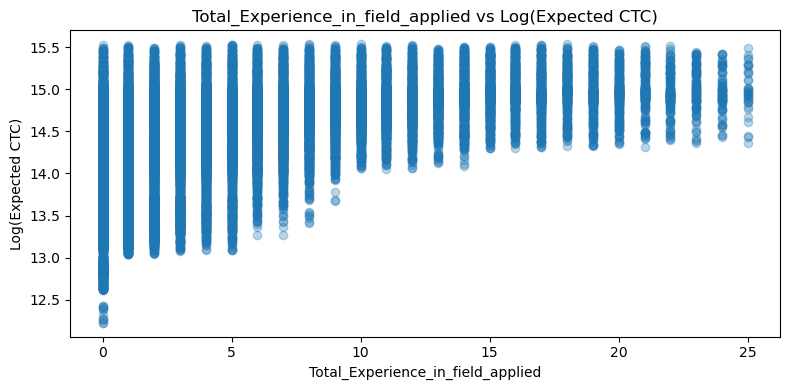

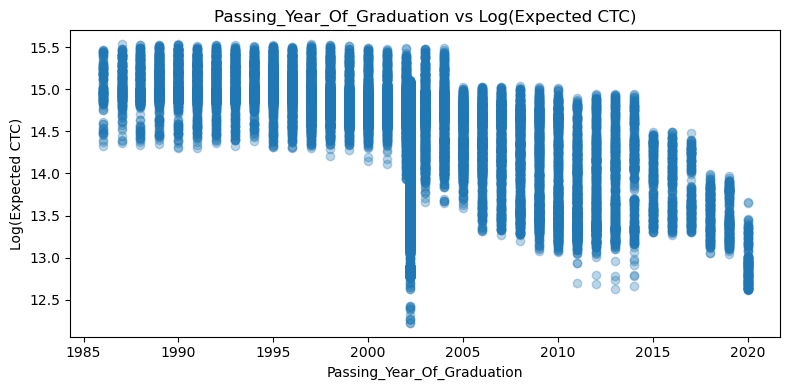

...

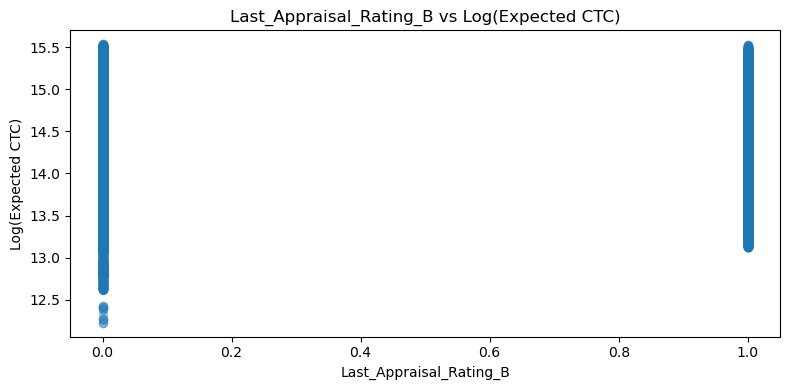

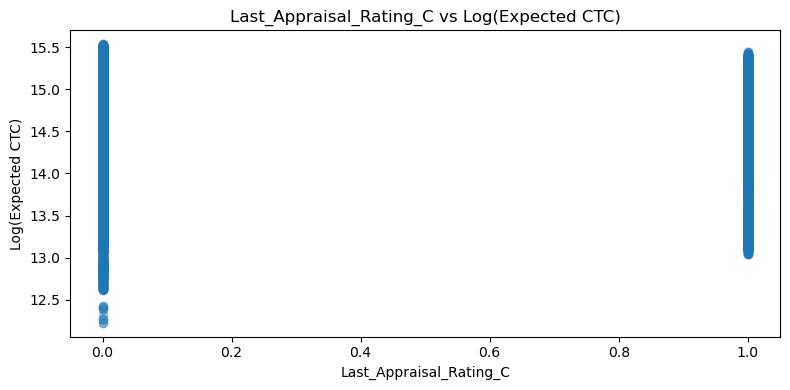

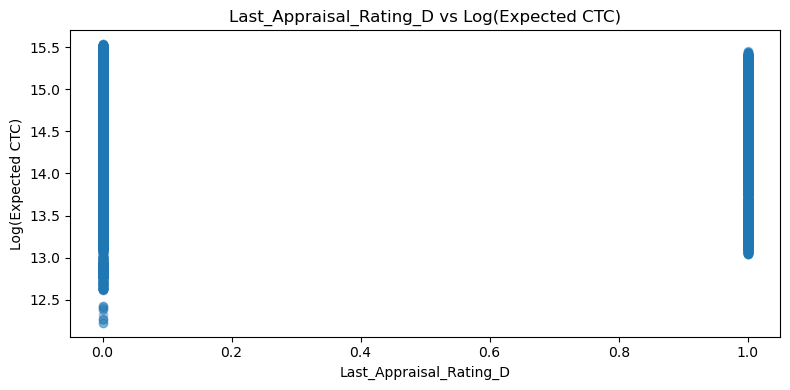

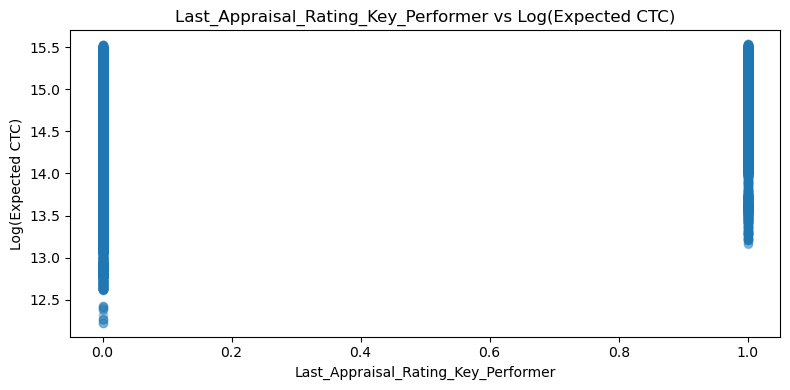

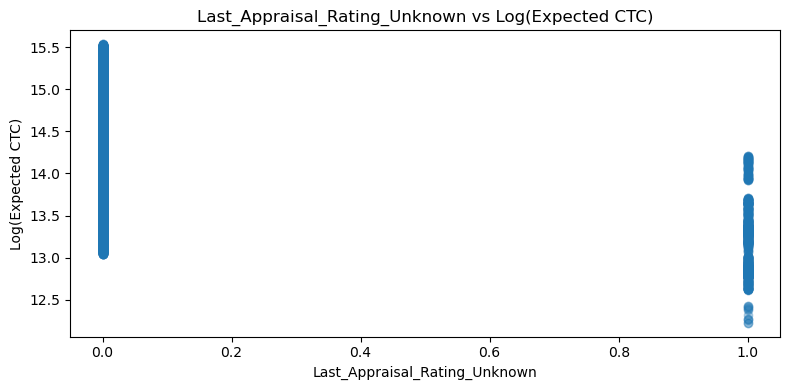

In [61]:
# Select only numeric (continuous) columns
numeric_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Plot scatter plots of each numeric feature vs Expected_CTC (log-scaled)
for label in numeric_cols:
    plt.figure(figsize=(8, 4))
    plt.scatter(df[label], np.log1p(y), alpha=0.3)
    plt.xlabel(label)
    plt.ylabel("Log(Expected CTC)")
    plt.title(f"{label} vs Log(Expected CTC)")
    plt.tight_layout()
    plt.show()

# Linear Regression

In [59]:
X=df.drop(columns="Expected_CTC")
y=df["Expected_CTC"]

In [83]:
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create pipeline
pipe = Pipeline([('scaler', StandardScaler()),('lr', LinearRegression())])

# Fixed param grid
param_grid = {'lr__fit_intercept': [True, False],'lr__positive': [True, False]}# Optional:test if forcing positive coefficients helps

# Grid search
grid = GridSearchCV(pipe, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)
grid.fit(X_train, y_train)

# Predict and evaluate
best_model = grid.best_estimator_
predictions = best_model.predict(X_test)

mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, predictions)

print("Best Parameters:", grid.best_params_)
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R² Score:", r2)


Best Parameters: {'lr__fit_intercept': True, 'lr__positive': False}
MAE: 50421.94175110602
MSE: 5379352215.28464
RMSE: 73344.06734893177
R² Score: 0.9960225903611786


### Checking for cross validation score

In [85]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(best_model, X, y, cv=5, scoring='r2')
print("Cross-validation R² scores:", scores)
print("Average R² score:", scores.mean())


Cross-validation R² scores: [0.99620948 0.99568904 0.99579858 0.99561652 0.99594254]
Average R² score: 0.9958512322689934


In [87]:
print("Score:",best_model.score(X_test,y_test))

Score: 0.9960225903611786


### coefficient and intercept values

In [89]:
# Extract the LinearRegression object from the pipeline
lr_model = best_model.named_steps['lr']

# Now you can safely access the coefficients and intercept
print("coef_:\n", lr_model.coef_)
print("\nintercept_:\n", lr_model.intercept_)


coef_:
 [-2.70486309e+02  7.23176859e+02 -2.13999934e+04  1.51756979e+02
 -2.17917559e+04  4.74906064e+02  9.41254241e+03  1.17090784e+06
  3.13649108e+02  6.38233381e+02 -5.96549714e+02  2.39558851e+02
 -4.06055535e+02 -7.67922911e+02  4.78249697e+01 -1.00831096e+03
 -6.87111761e+02 -7.00125706e+02 -1.01003997e+03  5.74542031e+01
 -1.00593870e+03 -9.05365455e+02 -1.09053409e+03 -8.76608510e+02
  3.56782370e+02  6.57656675e+02  7.41010781e+02  1.18015748e+02
 -7.42592327e+02  7.69963277e+02  2.03286470e+02  2.78356182e+02
 -1.13723424e+03  1.49842985e+02  1.40820501e+02  1.04133420e+03
  1.40606102e+03 -1.63152510e+02  4.98503376e+00  5.96911258e+02
 -8.91751626e+01  8.59615323e+01  5.28042724e+01  4.56749550e+01
  1.09906961e+02 -1.00611605e+02  2.69270045e+02  2.26447955e+03
  2.08747297e+02  2.80329606e+02  4.85110247e+02  4.88173733e+01
  6.25477053e+02  6.76108170e+02  4.55639225e+02  6.53914393e+02
  2.79425740e+02 -3.55416749e+02  3.06121658e+04 -7.85531269e+02
 -1.16291268e+03 

### Actual VS Predicted CTC

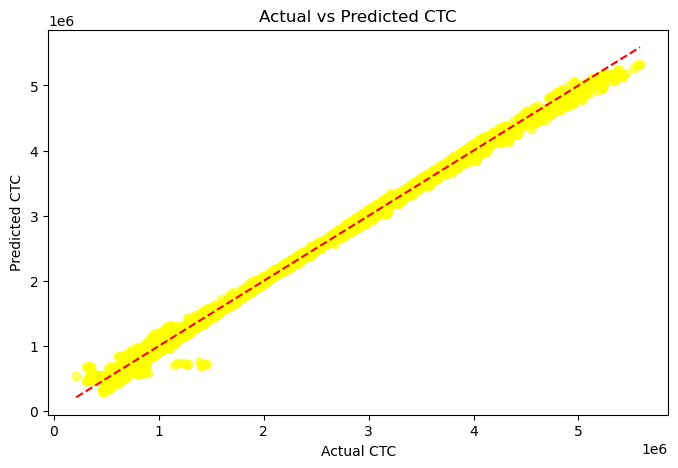

In [66]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.scatter(y_test, predictions, alpha=0.6, color='yellow')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual CTC")
plt.ylabel("Predicted CTC")
plt.title("Actual vs Predicted CTC")
plt.show()


### Top 10 impactful features

In [90]:
coef_df = pd.DataFrame({'Feature': X.columns, 'Coefficient': lr_model.coef_})
coef_df = coef_df.sort_values(by='Coefficient', key=abs, ascending=False)
print(coef_df.head(10))

                               Feature   Coefficient
7                          Current_CTC  1.170908e+06
93                      Education_Grad -8.875070e+04
199            Last_Appraisal_Rating_D -8.220136e+04
198            Last_Appraisal_Rating_C -8.026178e+04
94                        Education_PG -5.464483e+04
58                    Industry_Unknown  3.061217e+04
201      Last_Appraisal_Rating_Unknown  3.061217e+04
74                Organization_Unknown  3.061217e+04
95                Education_Under Grad -2.913936e+04
105  Graduation_Specialization_Unknown -2.913936e+04


# Ridge Model

In [68]:
from sklearn.linear_model import Ridge

ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
predictions=ridge.predict(X_test)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, predictions)

print("Mean Absolute Error (MAE):", mae)
print("Meab Square Error (MSE):",mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R² Score:", r2)

Mean Absolute Error (MAE): 50410.99773463842
Meab Square Error (MSE): 5378496556.196957
Root Mean Squared Error (RMSE): 73338.23393153776
R² Score: 0.9960232230222438


In [69]:
from sklearn.metrics import r2_score

y_test_pred = best_model.predict(X_test)
print("Test R² Score:", r2_score(y_test, y_test_pred))


Test R² Score: 0.9960225903611786


# Saving the model

In [75]:
# Save your entire pipeline (including scaler and model)
import joblib
joblib.dump(best_model, "ctc_prediction_model.joblib")

['ctc_prediction_model.joblib']

In [93]:
# To load and use the model
ctc_model = joblib.load("ctc_prediction_model.joblib")
y_pred = ctc_model.predict(X_test)
y_pred# X_test should be scaled in the same way

array([3106780.71180962, 1220574.18868455, 3545905.95182786, ...,
       1700890.86876438, 4374214.88149687, 3353911.38093893])

In [92]:
# Extract LinearRegression model from the loaded pipeline
lr_model = ctc_model.named_steps['lr']

# Print coefficients and intercept
print("coef_:\n", lr_model.coef_)
print("\nintercept_:\n", lr_model.intercept_)


coef_:
 [-2.70486309e+02  7.23176859e+02 -2.13999934e+04  1.51756979e+02
 -2.17917559e+04  4.74906064e+02  9.41254241e+03  1.17090784e+06
  3.13649108e+02  6.38233381e+02 -5.96549714e+02  2.39558851e+02
 -4.06055535e+02 -7.67922911e+02  4.78249697e+01 -1.00831096e+03
 -6.87111761e+02 -7.00125706e+02 -1.01003997e+03  5.74542031e+01
 -1.00593870e+03 -9.05365455e+02 -1.09053409e+03 -8.76608510e+02
  3.56782370e+02  6.57656675e+02  7.41010781e+02  1.18015748e+02
 -7.42592327e+02  7.69963277e+02  2.03286470e+02  2.78356182e+02
 -1.13723424e+03  1.49842985e+02  1.40820501e+02  1.04133420e+03
  1.40606102e+03 -1.63152510e+02  4.98503376e+00  5.96911258e+02
 -8.91751626e+01  8.59615323e+01  5.28042724e+01  4.56749550e+01
  1.09906961e+02 -1.00611605e+02  2.69270045e+02  2.26447955e+03
  2.08747297e+02  2.80329606e+02  4.85110247e+02  4.88173733e+01
  6.25477053e+02  6.76108170e+02  4.55639225e+02  6.53914393e+02
  2.79425740e+02 -3.55416749e+02  3.06121658e+04 -7.85531269e+02
 -1.16291268e+03 